# [IAPR 2019:][iapr2019] Special project

**Group members:**
    1- first name and last name,
    2- first name and last name,
    3- first name and last name

**Due date:** 30.05.2019

[iapr2019]: https://github.com/LTS5/iapr-2019


## Description
Please find the description of this special project via [this link].

[this link]: https://github.com/LTS5/iapr-2019/blob/master/project/special_project_description.pdf

## Part 0: Loading the data

In [1]:
import os
import tarfile
import numpy as np
import scipy as scp
import skimage.io
import matplotlib.pyplot as plt
import matplotlib.patches as patches
%matplotlib inline

#  Folder extraction
data_base_path = os.path.join(os.pardir, 'data')
data_folder = 'project-data'
tar_path = os.path.join(data_base_path, data_folder + '.tar.gz')
with tarfile.open(tar_path, mode='r:gz') as tar:
    tar.extractall(path=data_base_path)

# Data project path
data_projet_path  = os.path.join(data_base_path,data_folder)
img_projet_path   = os.path.join(data_projet_path,'images')
annot_projet_path = os.path.join(data_projet_path,'annotations')
# Read files that contains names
val_name_file  ='validation.txt'
test_name_file ='test.txt'
train_name_file='train.txt'

# Validation
val_img_fn_path = os.path.join(data_projet_path,val_name_file)
val_img_names= [line.rstrip('\n') for line in open(val_img_fn_path)]
val_img_fn   = [line +'.jpg' for line in val_img_names]
val_img_path = [os.path.join(os.path.join(img_projet_path,'validation'),line) for line in val_img_fn]
val_ic = skimage.io.imread_collection(val_img_path)
print('Number of validation images: ', len(val_ic))

# Train
tr_img_fn_path = os.path.join(data_projet_path,train_name_file)
tr_img_names= [line.rstrip('\n') for line in open(tr_img_fn_path)]
tr_img_fn   = [line +'.jpg' for line in tr_img_names]
tr_img_path = [os.path.join(os.path.join(img_projet_path,'train'),line) for line in tr_img_fn]
tr_ic = skimage.io.imread_collection(tr_img_path)
print('Number of validation images: ', len(tr_ic))

# Test
tst_img_fn_path = os.path.join(data_projet_path,test_name_file)
tst_img_names= [line.rstrip('\n') for line in open(tst_img_fn_path)]
tst_img_fn   = [line +'.jpg' for line in tst_img_names]
tst_img_path = [os.path.join(os.path.join(img_projet_path,'test'),line) for line in tst_img_fn]
tst_ic = skimage.io.imread_collection(tst_img_path)
print('Number of test images: ', len(tst_ic))

Number of validation images:  150
Number of validation images:  800
Number of test images:  50


In [2]:
import xml.etree.ElementTree as ET

def parse_file(filename):
    """ Parse a PASCAL VOC xml file """
    tree = ET.parse(filename)
    objects = []
    for obj in tree.findall('object'):
        obj_struct = {}
        obj_struct['name'] = obj.find('name').text
        bbox = obj.find('bndbox')
        obj_struct['bbox'] = [int(float(bbox.find('xmin').text)),
                              int(float(bbox.find('ymin').text)),
                              int(float(bbox.find('xmax').text))-int(float(bbox.find('xmin').text)),
                              int(float(bbox.find('ymax').text))-int(float(bbox.find('ymin').text))]
        objects.append(obj_struct)

    return objects

# Xml annotations
val_xml_path = os.path.join(annot_projet_path, 'validation')
val_xmls = [parse_file(os.path.join(val_xml_path,name + '.xml')) for name in val_img_names]

tr_xml_path = os.path.join(annot_projet_path,'train')
tr_xmls = [parse_file(os.path.join(tr_xml_path,name + '.xml')) for name in tr_img_names]

tst_xml_path = os.path.join(annot_projet_path,'test')
tst_xmls = [parse_file(os.path.join(tst_xml_path,name + '.xml')) for name in tst_img_names]

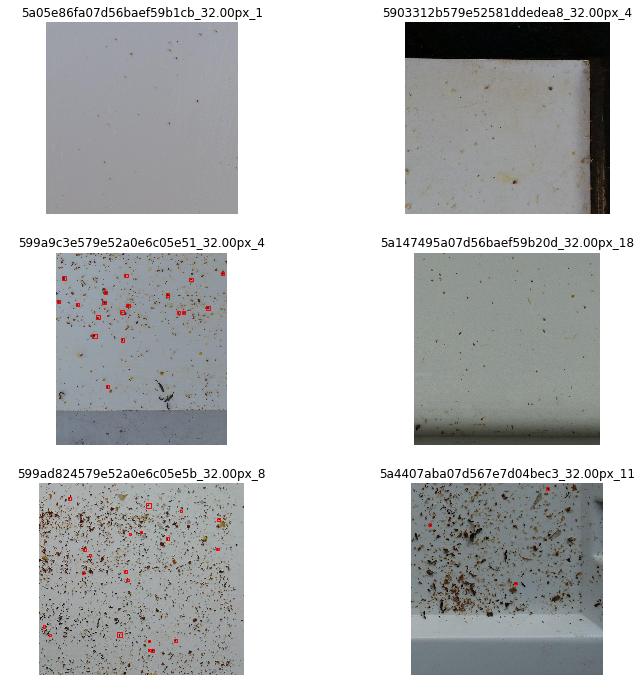

In [3]:
# Plot images
fig, axes = plt.subplots(3, 2, figsize=(12, 12))
for ax, im, nm, annotations in zip(axes.ravel(), tst_ic, tst_img_names[0:6], tst_xmls):
    # Iterate over annotations
    for anno in annotations:
        rect = patches.Rectangle((anno['bbox'][0], anno['bbox'][1]), anno['bbox'][2], anno['bbox'][3],
                linewidth=1,edgecolor='r',facecolor='none')
        ax.add_patch(rect)
    
    ax.imshow(im)
    ax.axis('off')
    ax.set_title(nm)
plt.show()

## Part 1: Finding varroas by segmentation
Add your implementation for ''**detect_by_segmentation**'' function. Please make sure the input and output follows the mentioned format.

In [9]:
# Import stuff
from skimage.filters import threshold_li
from skimage.color   import rgb2gray
from skimage.measure import label

from skimage.morphology import erosion, dilation, opening, closing, white_tophat
from skimage.morphology import black_tophat, skeletonize, convex_hull_image
from skimage.morphology import disk

def pipeline(rgb_input_img):
    """ Input : RGB image of varroa infection
        Ouput : Binary image of detected varroa 
        Function : Process the image in order to keep the relevant informations """
    # Principal pipeline 

    # Preprocessing
    
    # Contrast enhancement
    sigmoid_p = 0.5
    rgb_input_img = skimage.exposure.adjust_sigmoid(rgb_input_img, cutoff=sigmoid_p, gain=10, inv=False)    
    
    # Color Selection
    single_canal = False
    
    input_img = rgb2gray(rgb_input_img)
    
    # Morphology operations
    
    struct_elem = disk(4)
    morph_img   = dilation(input_img, struct_elem)# Remove waste on images
    struct_elem = disk(4)
    morph_img   = erosion(morph_img,struct_elem) # Give proportion again to varroa
    
    # Thresholding
    
    # Li method thres.
    li_thres = threshold_li(morph_img)
        
    # Binarization
    bin_min  = morph_img < li_thres


    # Plot the results
    plot_processing = True
    if True == plot_processing:
        fig, axes = plt.subplots(ncols=3, figsize=(15, 15))
        ax = axes.ravel()

        ax[0].imshow(input_img)
        ax[0].set_xlabel('Orig.')

        ax[1].imshow(morph_img)
        ax[1].set_xlabel('Morph. processing.')

        ax[2].imshow(bin_min)
        ax[2].set_xlabel('Minimal thres.')
        plt.show()
    
    
    # Assign the output to final processing
    output = bin_min
    
    return output

def label_varroa_region(input_image):
    """ Input  : Binary image of detected varroa
        Output : Multiples labellised regions of the image"""
    output_labels,num_labels = label(input_image,return_num=True,connectivity=None)
    return output_labels

In [10]:
from skimage.measure import regionprops

def xml_annotation_to_bbox(xml_annotation):
    """ Convert an xml annotation to a list of bbox tuples"""
    bbox_list = []
    for elem in xml_annotation:
        bbox_coords = elem['bbox']
        bbox_tuple  = tuple(bbox_coords)
        bbox_list.append(bbox_tuple)
    
    return bbox_list


def iou_bbox(gt_reg,pred_reg):
    """ 
        Compute the IoU between two region with their bounding boxes
        
        Insipired from : https://www.pyimagesearch.com/2016/11/07/intersection-over-union-iou-for-object-detection/
        
        Parameters
        ----- 
        pred_reg format : (MIN_ROW,MIN_COL,MAX_ROW,MAX_COL)
        pred_reg pixels in bounding box are in half-open interval [min_row; max_row) and [min_col; max_col).
        gt_reg h-format : (x, y, width, heigth) in some cartesian form
        gt_reg format   : (MIN_COL,MIN_ROW, MAX_ROW-MIN_ROW, MAX_COL-MIN_COL)
        
        Return
        -----
        float val in [0,1]
    """
    # x:rows and y:colummns are (0,0) at right corner
    
    # Harmonize the coordinates systems of the bounding boxes
    g_y_min,g_x_min,diff_x,diff_y   = gt_reg
    g_y_max = g_y_min + diff_y 
    g_x_max = g_x_min + diff_x
    
    # In ground truth max_values are inside the bbox but in label are outside 
    p_x_min,p_y_min,p_x_max,p_y_max = pred_reg
    # Correction of max values
    p_x_max = p_x_max - 1
    p_y_max = p_y_max - 1
    
    # Determine the (x,y) coordinates of the intersection rectangle
    i_x_min = max(p_x_min,g_x_min)
    i_y_min = max(p_y_min,g_y_min)
    i_x_max = min(p_x_max,g_x_max)
    i_y_max = min(p_y_max,g_y_max)
    
    # Compute the intersection area (robust to non-matching rect.s)
    inter_area = max(0,i_x_max -  i_x_min + 1) * max(0,i_y_max - i_y_min + 1)
    
    
    # Compute the area of both the prediction and the ground-truth
    pred_rect = (p_x_max-p_x_min+1)*(p_y_max-p_y_min+1) 
    gt_rect   = (g_x_max-g_x_min+1)*(g_y_max-g_y_min+1)

    debug_print = False
    
    if True == debug_print:
        print(" GT : {}:{}/{}:{}".format(g_x_min,g_y_min,g_x_max,g_y_max))
        print(" PR : {}:{}/{}:{}".format(p_x_min,p_y_min,p_x_max,p_y_max))
        print("INTER : {}".format(inter_area))
        print("PRED_AREA : {}".format(pred_rect))
        print("GT   AREA : {}".format(gt_rect))
    
    # Compute the intersection over union
    iou_val = inter_area/(gt_rect+pred_rect-inter_area)
    return iou_val
    
    

def detection_statistics(pred_image,gt_labels,threshold):
    """
    
    Returns a tuple composed by pred_region_stats and gt_region_stats
    
    Parameters
    ------
    pred_image : labeled image
    gt_labels  : list of bbox tuples per ground truth region
    threshold  : IoU threshold
    
    Returns
    ------
    (pred_region_stats,gt_region_stats)
    
    pred_region_stats :
    a list of size of number of predicted region having the following status depending on the IoU criteria
    3 : True  positive (region is correct)
    1 : False positive (region doesn't exist in ground truth or don't match enough)
    
    gt_region_stats :
    a list of size of number of ground truth region having the following status depending on the IoU criteria
    0 : Region being detected
    -3: False negative (existing region not detected)
    """
    debug_print = False # Variable to enable debuging information  
        
    props_list = regionprops(pred_image) # Properties of the labelled image
    pred_region_status = np.zeros(len(props_list)) # Select between true or false positive
    pred_region_argmax = np.zeros(len(props_list)) # Array that stores the best IoU idx per predicted region
    gt_region_status = np.zeros(len(gt_labels))    # Store if ground truth region is being detected.
    
    # Rows : Gt regions,Cols : Predicted regions
    iou_array = np.zeros((len(gt_labels),len(props_list)),dtype=np.float64)     
    
    # Compute all the IoU bruteforce method
    for idx_a,a in enumerate(gt_labels):
        for idx_b,b in enumerate(props_list):
            b_bbox = b.bbox
            
            # Debug info begin
            if True == debug_print:
                print("gt_idx {} / reg_idx {} ".format(idx_a,idx_b))
                print("Bbox coords ----------")
                print("GT : {}\nPRED : {}".format(a,b_bbox))
            # Debug info end
            iou_array[idx_a,idx_b] = iou_bbox(a,b_bbox)
    
    # Debug info begin
    if True == debug_print:
        print("--------------")
        print("mtx size : {}",iou_array.shape)
        print(iou_array)
        print("--------------")
    # Debug info end
    
    # Compute the false positive (pred region which IoU equals 0 over the ground truth is equal to zero)
    false_pos_idx = [iou_array.sum(0) == 0]
    pred_region_status[false_pos_idx] = 1.0 # False positive
    pred_region_argmax[false_pos_idx] = -1.0 # False positive then no assignation to a region
    
    # Compute the true positive depending on the threshold
    for pred_idx,elem in enumerate(pred_region_status):
        if elem != 1.0:
            gt_idx = iou_array[:,pred_idx].argmax() # Get the maximum IoU
            # Check if IoU is above the threshold
            if iou_array[gt_idx,pred_idx] >= threshold:
                pred_region_status[pred_idx] = 3. # True positive
                pred_region_argmax[pred_idx] = gt_idx # Assign the predicted region to a ground truth region
            else:
                pred_region_status[pred_idx] = 1.   # False positive
                pred_region_argmax[pred_idx] = -1.0 # False positive then no assignation to a region       
                
    # Compute the false negative
    for idx,elem in enumerate(gt_region_status):
        if idx not in pred_region_argmax: # If no predicted region has been assigned to a ground truth region
            gt_region_status[idx] = -3.0 # False negative
    
    return (pred_region_status,gt_region_status)

In [11]:
def precision(region_stats,gt_stats):
    """ Compute the precision of the image detection tp/tp+fp"""
    unique,counts = np.unique(region_stats, return_counts=True) # Get the list of number and # of occurences
    stats_dict = dict(zip(unique,counts))
    tp = stats_dict.get(3.0,0.0) # Get the number of true positive
    fp = stats_dict.get(1.0,0.0) # Get the number of false positive 
    
    # If nothing is detected then return zero (avoid numerical error)
    if 0.0 == tp+fp:
        return 0.0
    else:
        return tp/(tp+fp)

def recall(region_stats,gt_stats):
    """ Compute the recall of the image detection tp/tp+fn"""
    
    unique,counts = np.unique(region_stats, return_counts=True) # Get the list of number and # of occurences
    stats_dict = dict(zip(unique,counts))
    tp = stats_dict.get(3.0,0.0) # Get the number of true positive
    
    unique,counts = np.unique(gt_stats, return_counts=True) # Get the list of number and # of occurences
    stats_dict = dict(zip(unique,counts))
    fn = stats_dict.get(-3.0,0.0) # Get the number of false negative 
    
    # If nothing is detected then return zero (avoid numerical error)
    if 0.0 == tp+fn :
        return 0.0
    else:
        return tp/(tp+fn)
    
    

def f1_score(region_stats,gt_stats):
    """"""
    rec  = recall(region_stats,gt_stats)
    prec = precision(region_stats,gt_stats)
    
    # If nothing is detected then return zero (avoid numerical error)
    if 0. == prec or 0. == rec:
        f1_val = 0.0
    else:
        f1_val = 2*prec*rec/(rec+prec)
    print("Stats : Rec : {} / Prec : {} / F1-score : {}".format(rec,prec,f1_val))
    return f1_val

In [12]:
def detect_by_segmentation(img):
    '''
    Input: One single image
    Output: A numpy array containing coordonates of all detected varroas, with the following format: 
            [[x_1, y_1, w_1, h_2], [x_2, y_2, w_1, h_2], ..., [x_n, y_n, w_n, h_n]] 
            where ''n'' is the number of detected varroas.
    '''
    
    bin_img = pipeline(img)
    label_img = label_varroa_region(bin_img)
    props_list = regionprops(label_img) # Properties of the labelled image
    bbox_list = []
    for elem in props_list:
            min_r,min_c,max_r,max_c = elem.bbox
            bbox_list.append([min_c,min_r,max_c-min_c-1,max_r-min_r-1]
    return bbox_list
    #Your code

Add your implementation. Report the Precision, Recall and F1-score, by using all 50 images of the test-set, and considering 0.3 as the IoU threshold.

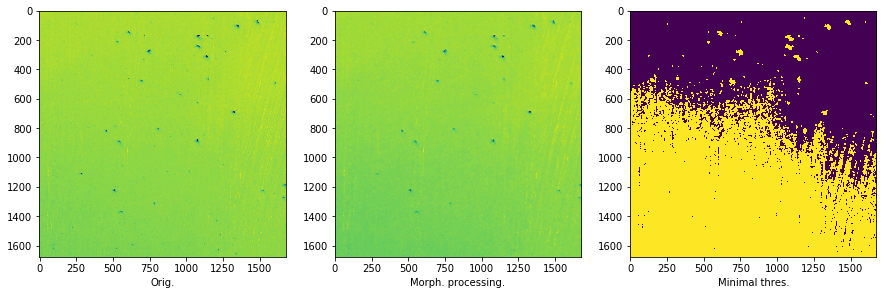

Image N° 0
IoU threshold : 0.3
Stats : Rec : 0.0 / Prec : 0.0 / F1-score : 0.0


C:\Users\Ismail-P51\Anaconda3\lib\site-packages\ipykernel_launcher.py:131: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\Ismail-P51\Anaconda3\lib\site-packages\ipykernel_launcher.py:132: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


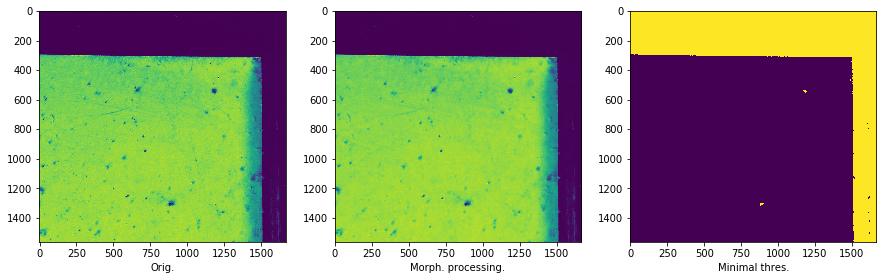

Image N° 1
IoU threshold : 0.3
Stats : Rec : 0.0 / Prec : 0.0 / F1-score : 0.0


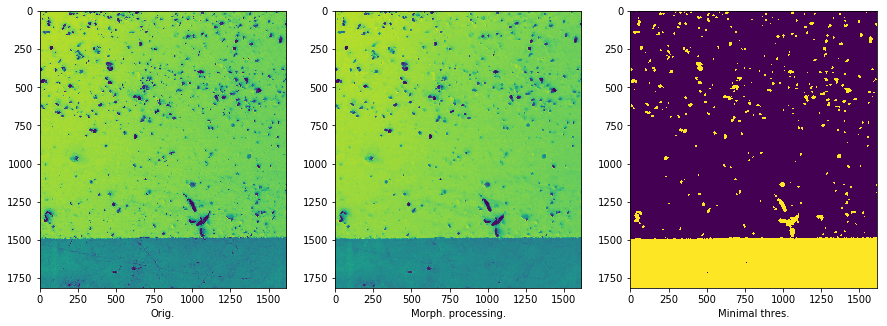

Image N° 2
IoU threshold : 0.3
Stats : Rec : 1.0 / Prec : 0.056962025316455694 / F1-score : 0.10778443113772454


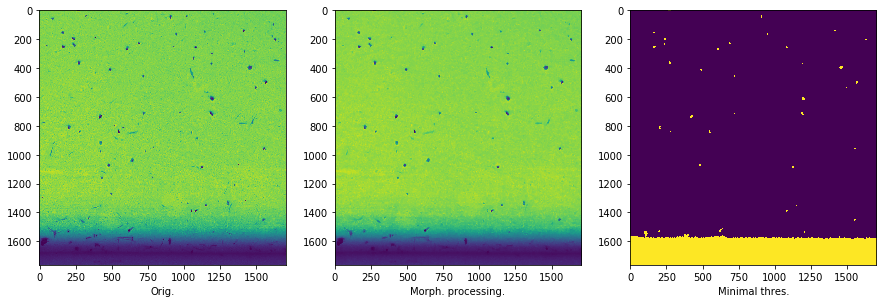

Image N° 3
IoU threshold : 0.3
Stats : Rec : 0.0 / Prec : 0.0 / F1-score : 0.0


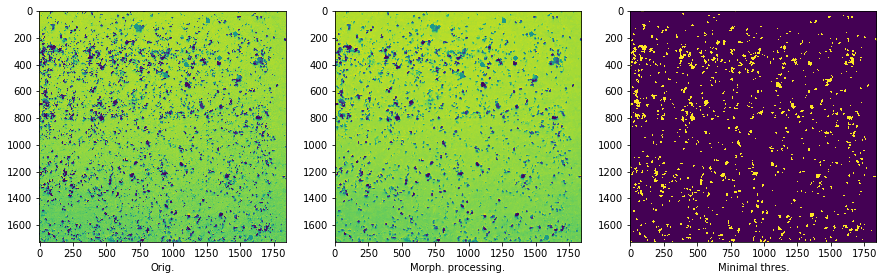

Image N° 4
IoU threshold : 0.3
Stats : Rec : 0.9 / Prec : 0.021151586368977675 / F1-score : 0.041331802525832385


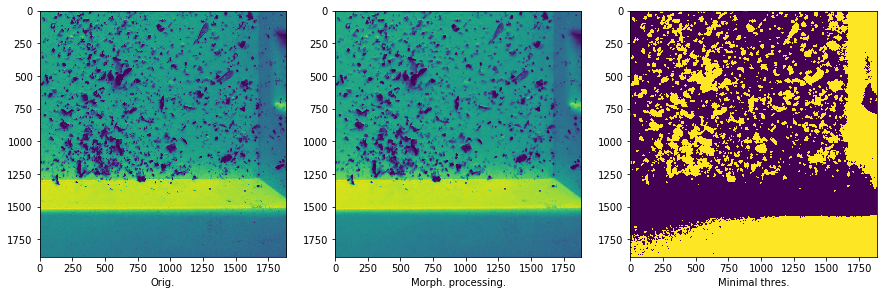

Image N° 5
IoU threshold : 0.3
Stats : Rec : 0.6666666666666666 / Prec : 0.002793296089385475 / F1-score : 0.005563282336578581


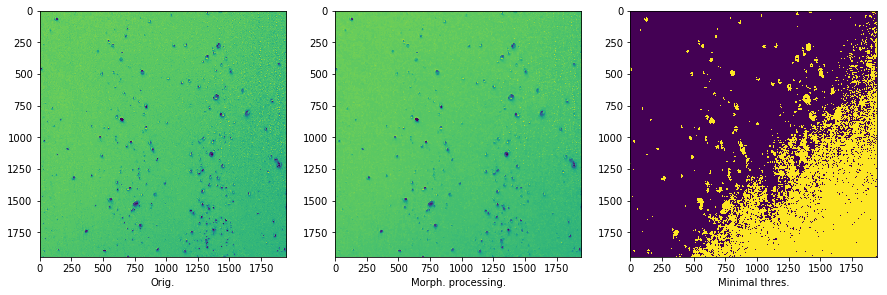

Image N° 6
IoU threshold : 0.3
Stats : Rec : 0.0 / Prec : 0.0 / F1-score : 0.0


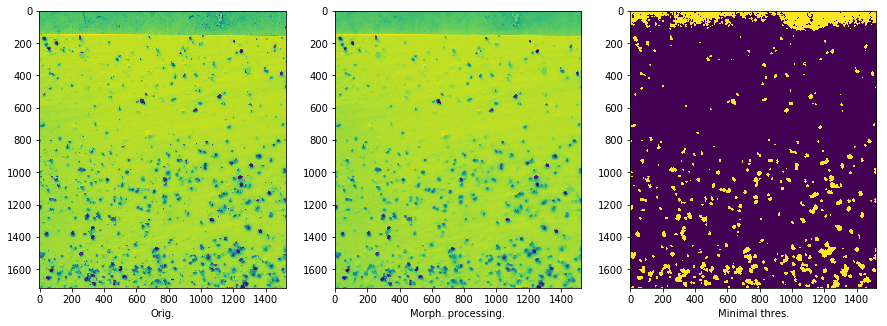

Image N° 7
IoU threshold : 0.3
Stats : Rec : 0.8666666666666667 / Prec : 0.06878306878306878 / F1-score : 0.12745098039215685


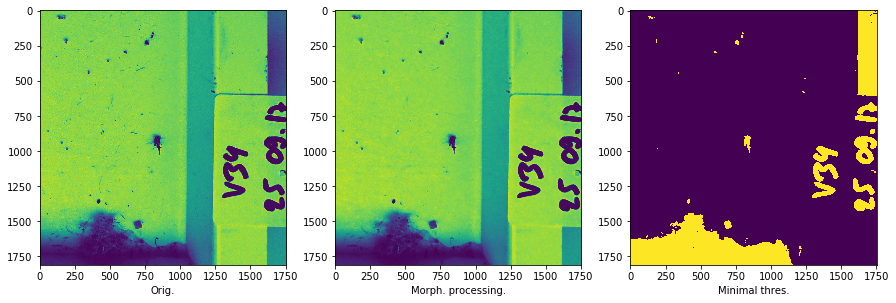

Image N° 8
IoU threshold : 0.3
Stats : Rec : 1.0 / Prec : 0.05128205128205128 / F1-score : 0.09756097560975609


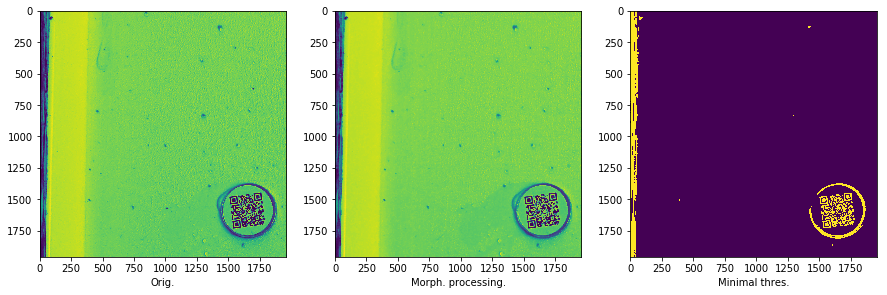

Image N° 9
IoU threshold : 0.3
Stats : Rec : 0.0 / Prec : 0.0 / F1-score : 0.0


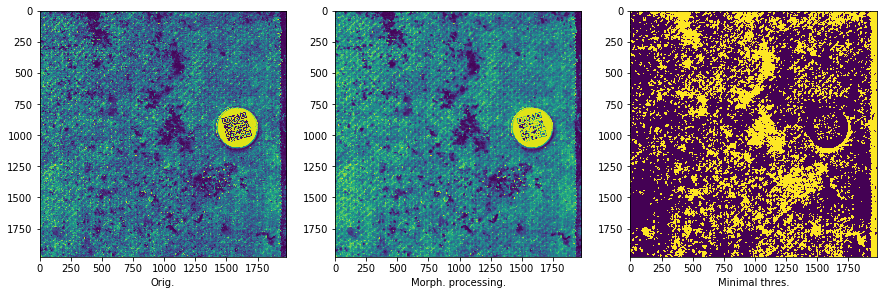

Image N° 10
IoU threshold : 0.3
Stats : Rec : 0.0 / Prec : 0.0 / F1-score : 0.0


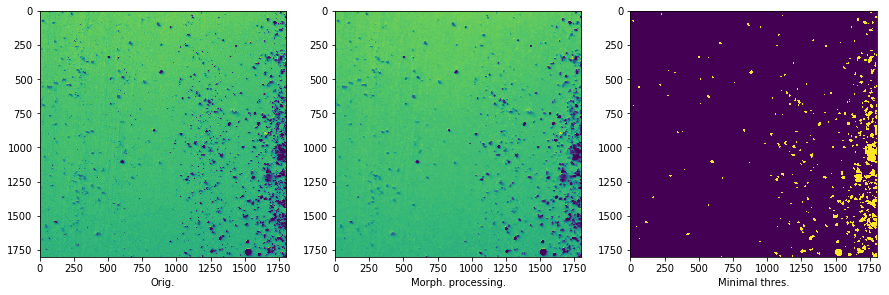

Image N° 11
IoU threshold : 0.3
Stats : Rec : 0.6666666666666666 / Prec : 0.06191950464396285 / F1-score : 0.11331444759206799


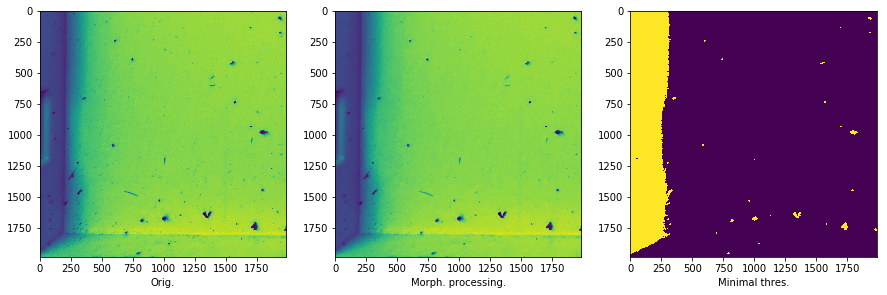

Image N° 12
IoU threshold : 0.3
Stats : Rec : 0.0 / Prec : 0.0 / F1-score : 0.0


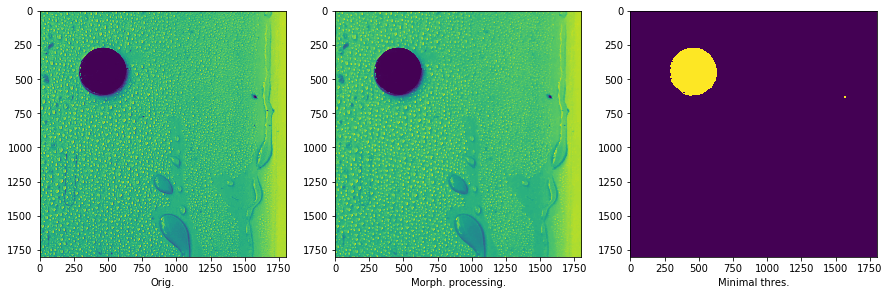

Image N° 13
IoU threshold : 0.3
Stats : Rec : 0.0 / Prec : 0.0 / F1-score : 0.0


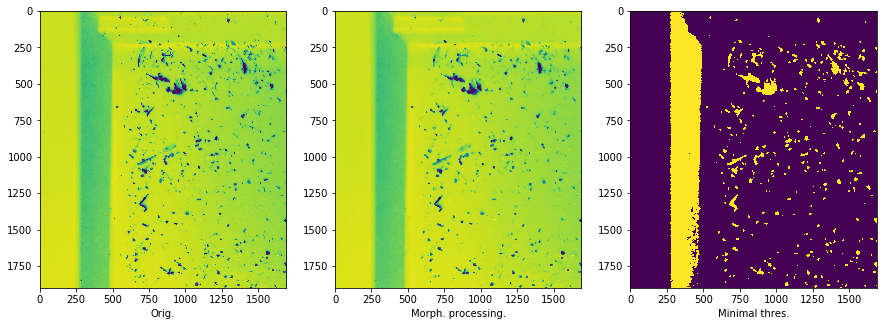

Image N° 14
IoU threshold : 0.3
Stats : Rec : 0.5 / Prec : 0.0029154518950437317 / F1-score : 0.005797101449275362


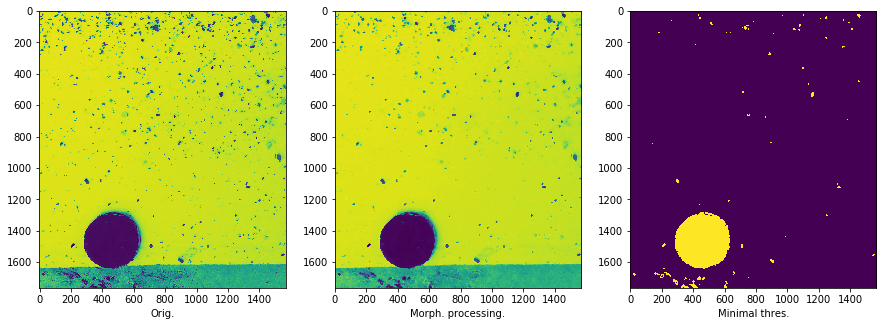

Image N° 15
IoU threshold : 0.3
Stats : Rec : 1.0 / Prec : 0.057971014492753624 / F1-score : 0.1095890410958904


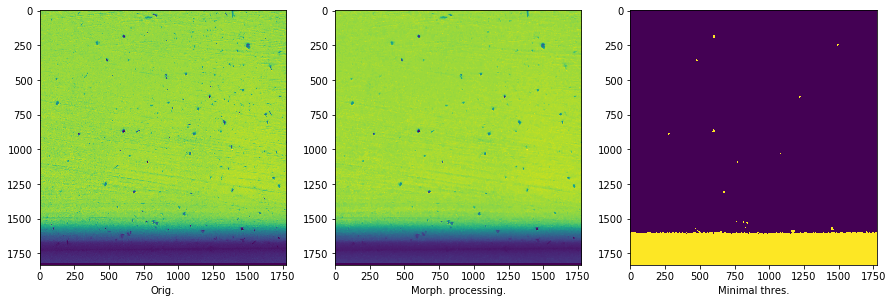

Image N° 16
IoU threshold : 0.3
Stats : Rec : 0.0 / Prec : 0.0 / F1-score : 0.0


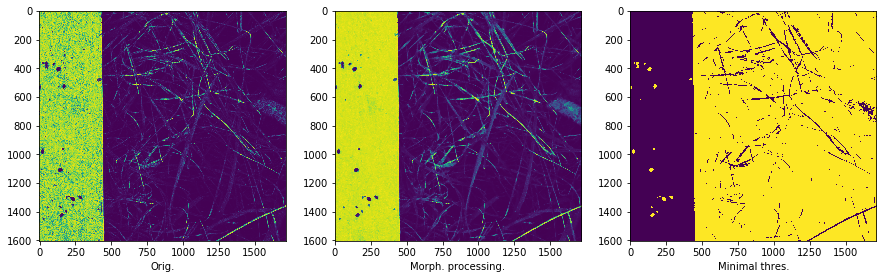

Image N° 17
IoU threshold : 0.3
Stats : Rec : 1.0 / Prec : 0.13636363636363635 / F1-score : 0.24000000000000002


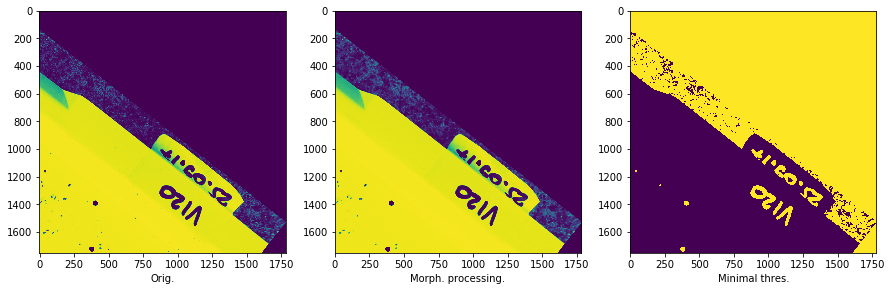

Image N° 18
IoU threshold : 0.3
Stats : Rec : 0.0 / Prec : 0.0 / F1-score : 0.0


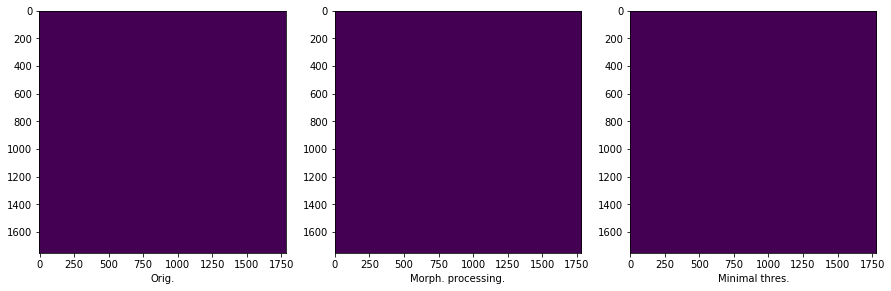

Image N° 19
IoU threshold : 0.3
Stats : Rec : 0.0 / Prec : 0.0 / F1-score : 0.0


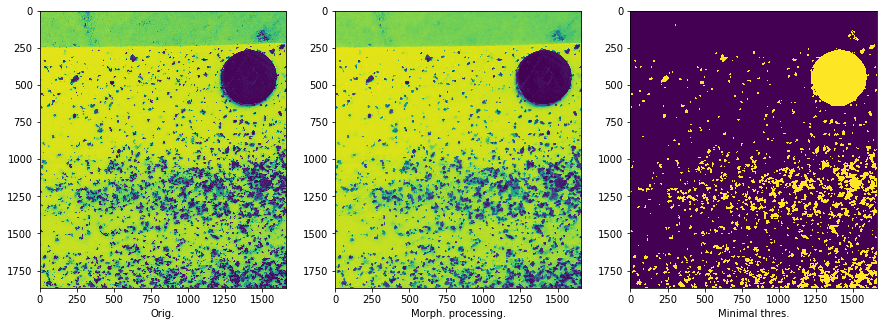

Image N° 20
IoU threshold : 0.3
Stats : Rec : 0.6666666666666666 / Prec : 0.009195402298850575 / F1-score : 0.018140589569160995


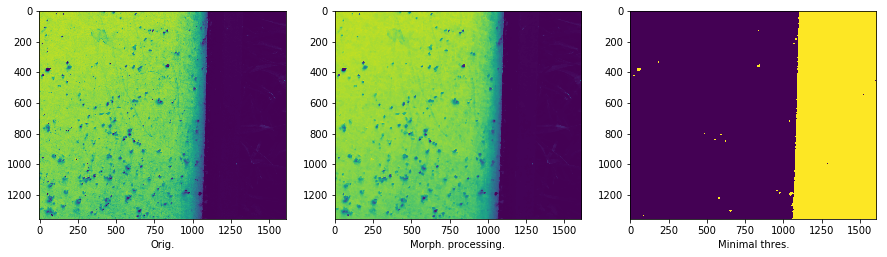

Image N° 21
IoU threshold : 0.3
Stats : Rec : 0.0 / Prec : 0.0 / F1-score : 0.0


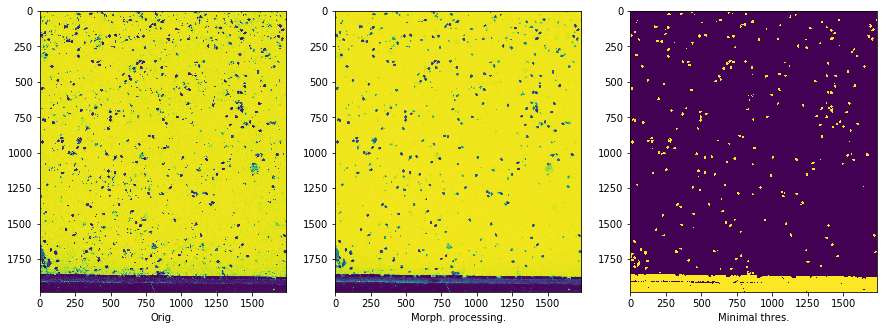

Image N° 22
IoU threshold : 0.3
Stats : Rec : 0.2995391705069124 / Prec : 0.2549019607843137 / F1-score : 0.27542372881355937


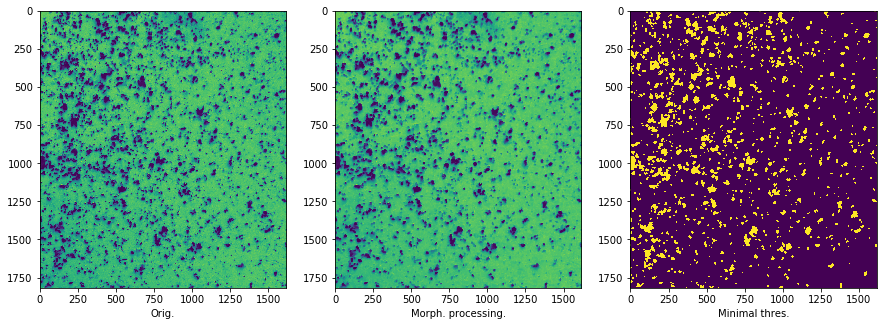

Image N° 23
IoU threshold : 0.3
Stats : Rec : 0.8125 / Prec : 0.014038876889848811 / F1-score : 0.02760084925690021


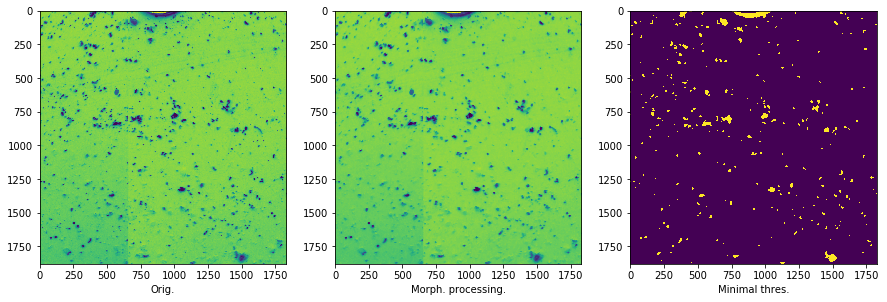

Image N° 24
IoU threshold : 0.3
Stats : Rec : 0.0 / Prec : 0.0 / F1-score : 0.0


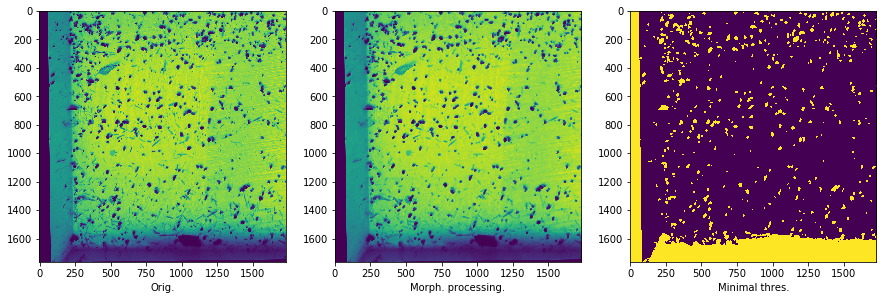

Image N° 25
IoU threshold : 0.3
Stats : Rec : 0.9473684210526315 / Prec : 0.07741935483870968 / F1-score : 0.14314115308151093


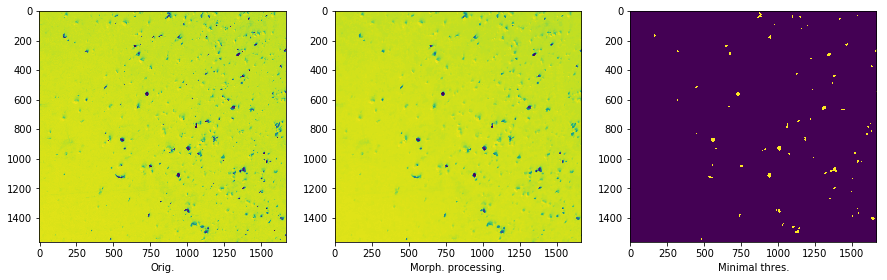

Image N° 26
IoU threshold : 0.3
Stats : Rec : 0.6666666666666666 / Prec : 0.05555555555555555 / F1-score : 0.10256410256410256


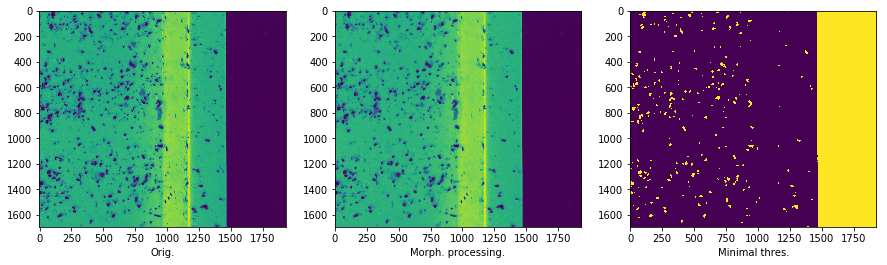

Image N° 27
IoU threshold : 0.3
Stats : Rec : 1.0 / Prec : 0.01556420233463035 / F1-score : 0.030651340996168584


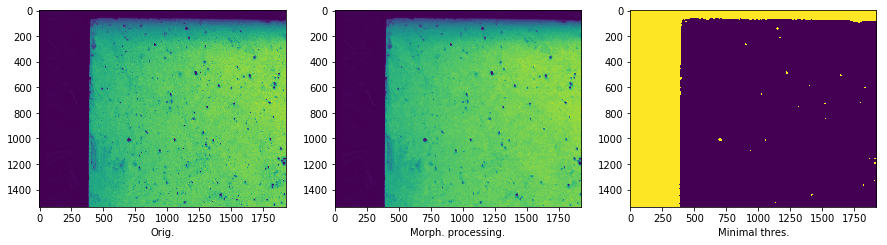

Image N° 28
IoU threshold : 0.3
Stats : Rec : 1.0 / Prec : 0.041666666666666664 / F1-score : 0.07999999999999999


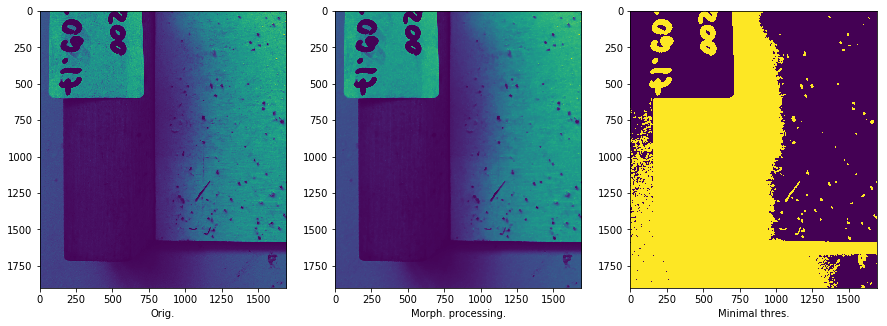

Image N° 29
IoU threshold : 0.3
Stats : Rec : 0.0 / Prec : 0.0 / F1-score : 0.0


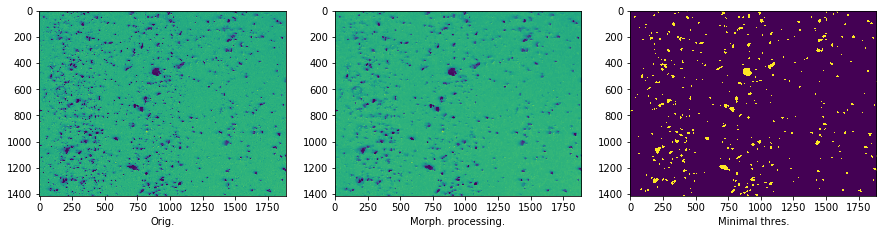

Image N° 30
IoU threshold : 0.3
Stats : Rec : 1.0 / Prec : 0.002570694087403599 / F1-score : 0.005128205128205128


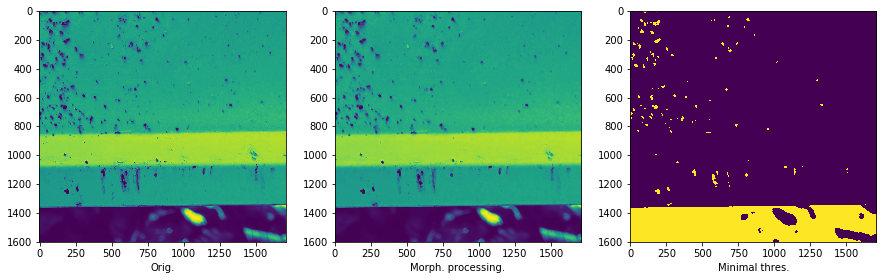

Image N° 31
IoU threshold : 0.3
Stats : Rec : 1.0 / Prec : 0.009259259259259259 / F1-score : 0.018348623853211007


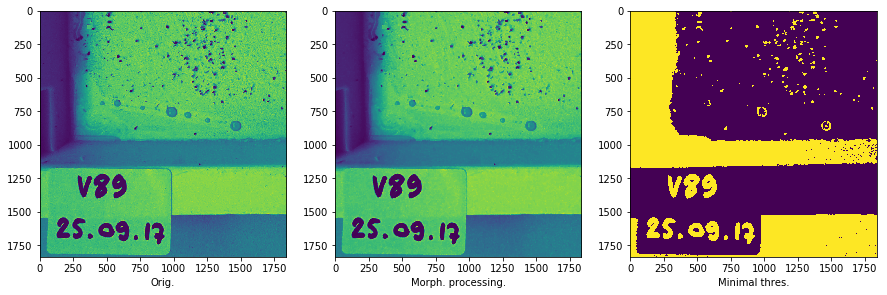

Image N° 32
IoU threshold : 0.3
Stats : Rec : 0.0 / Prec : 0.0 / F1-score : 0.0


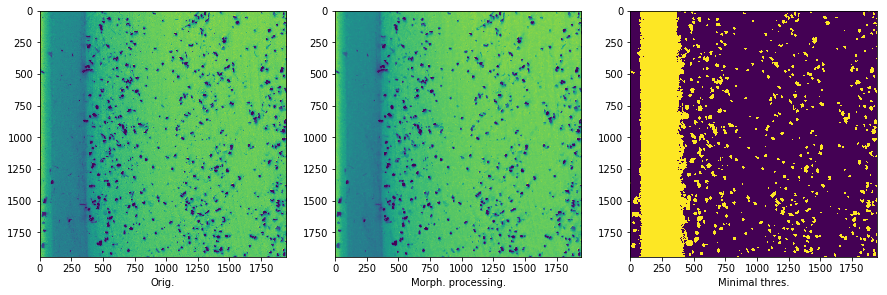

Image N° 33
IoU threshold : 0.3
Stats : Rec : 0.6 / Prec : 0.016822429906542057 / F1-score : 0.03272727272727273


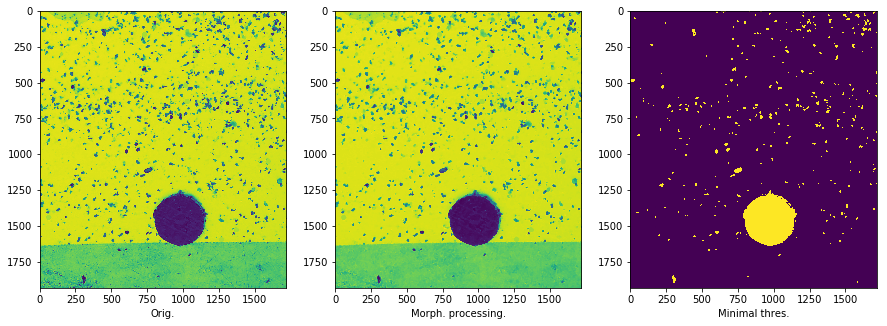

Image N° 34
IoU threshold : 0.3
Stats : Rec : 0.6363636363636364 / Prec : 0.022222222222222223 / F1-score : 0.04294478527607362


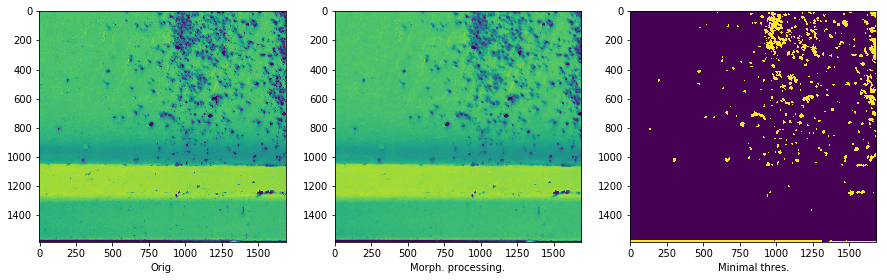

Image N° 35
IoU threshold : 0.3
Stats : Rec : 0.5 / Prec : 0.009771986970684038 / F1-score : 0.019169329073482427


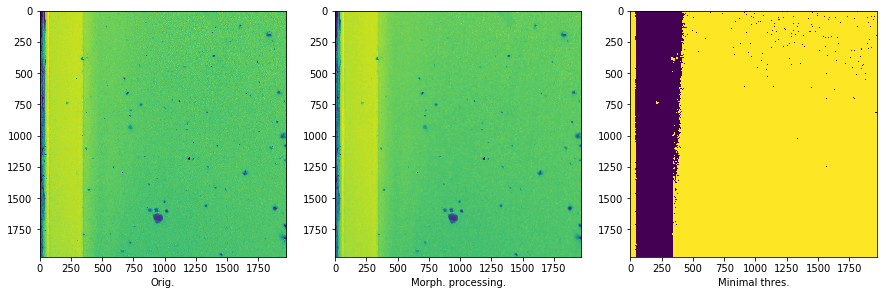

Image N° 36
IoU threshold : 0.3
Stats : Rec : 0.0 / Prec : 0.0 / F1-score : 0.0


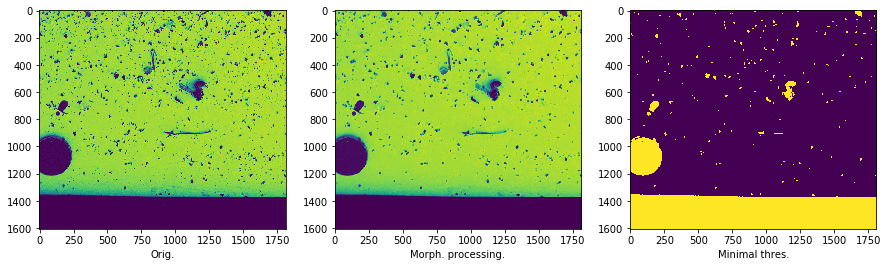

Image N° 37
IoU threshold : 0.3
Stats : Rec : 1.0 / Prec : 0.005235602094240838 / F1-score : 0.010416666666666668


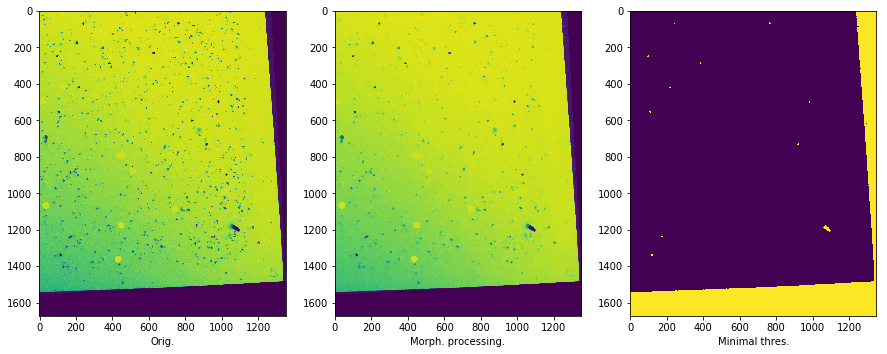

Image N° 38
IoU threshold : 0.3
Stats : Rec : 0.8 / Prec : 0.6666666666666666 / F1-score : 0.7272727272727272


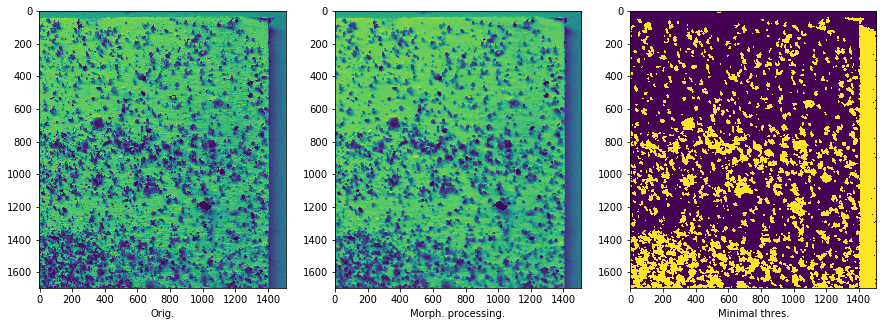

Image N° 39
IoU threshold : 0.3
Stats : Rec : 0.125 / Prec : 0.002509410288582183 / F1-score : 0.004920049200492005


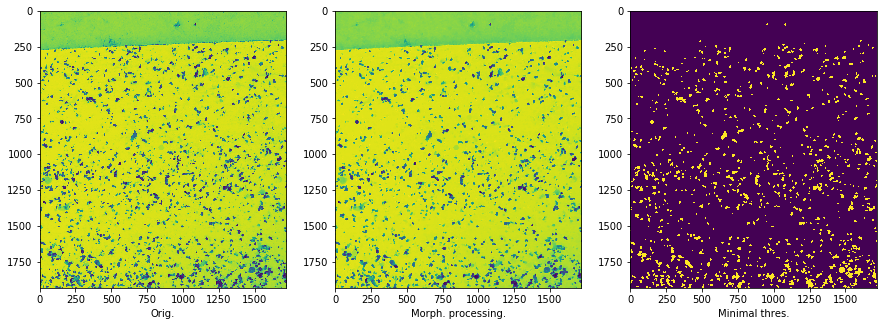

Image N° 40
IoU threshold : 0.3
Stats : Rec : 1.0 / Prec : 0.0077348066298342545 / F1-score : 0.015350877192982459


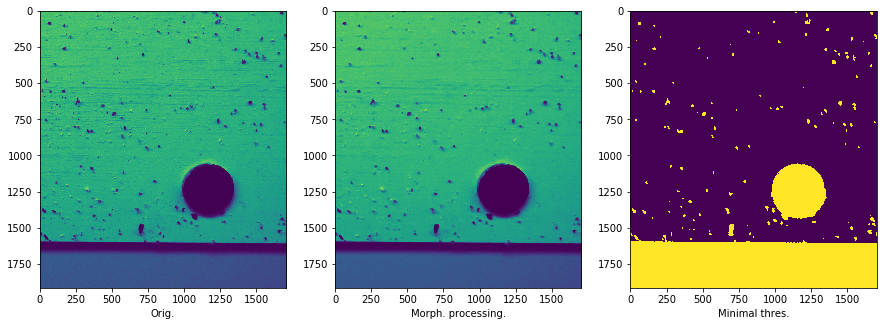

Image N° 41
IoU threshold : 0.3
Stats : Rec : 0.0 / Prec : 0.0 / F1-score : 0.0


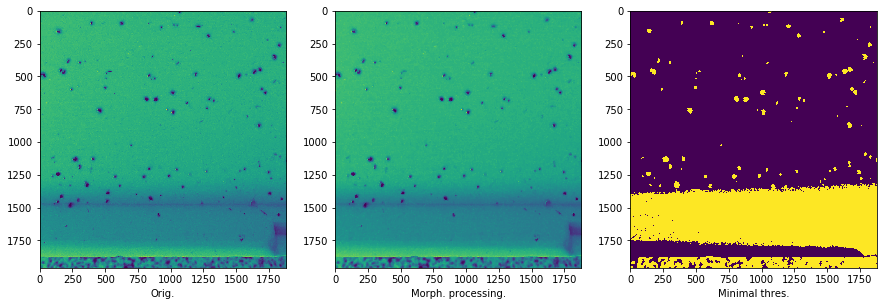

Image N° 42
IoU threshold : 0.3
Stats : Rec : 0.0 / Prec : 0.0 / F1-score : 0.0


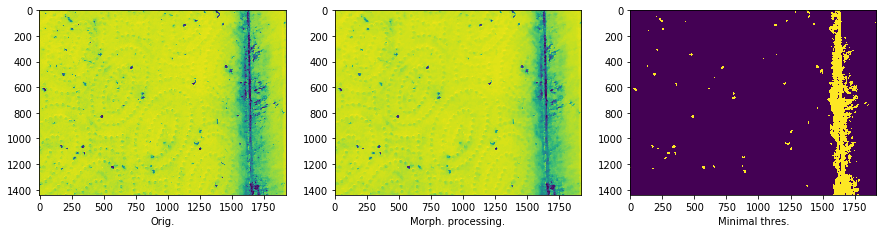

Image N° 43
IoU threshold : 0.3
Stats : Rec : 0.875 / Prec : 0.08536585365853659 / F1-score : 0.15555555555555559


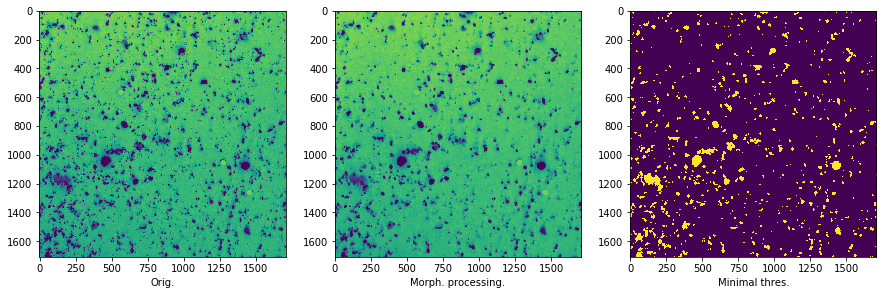

Image N° 44
IoU threshold : 0.3
Stats : Rec : 1.0 / Prec : 0.008955223880597015 / F1-score : 0.01775147928994083


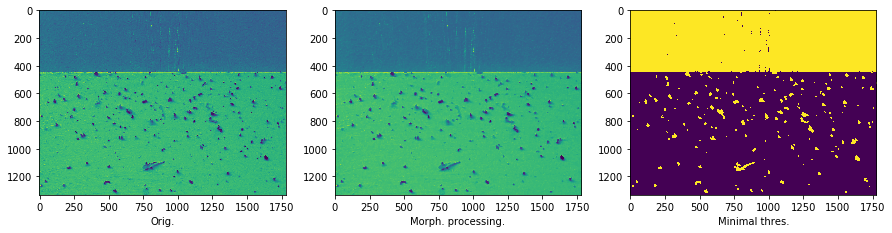

Image N° 45
IoU threshold : 0.3
Stats : Rec : 0.0 / Prec : 0.0 / F1-score : 0.0


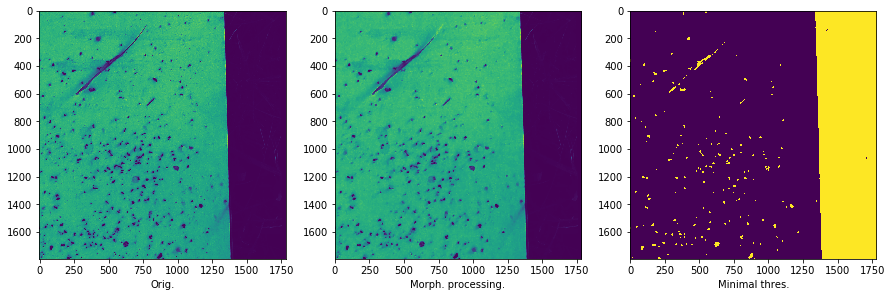

Image N° 46
IoU threshold : 0.3
Stats : Rec : 1.0 / Prec : 0.0056179775280898875 / F1-score : 0.0111731843575419


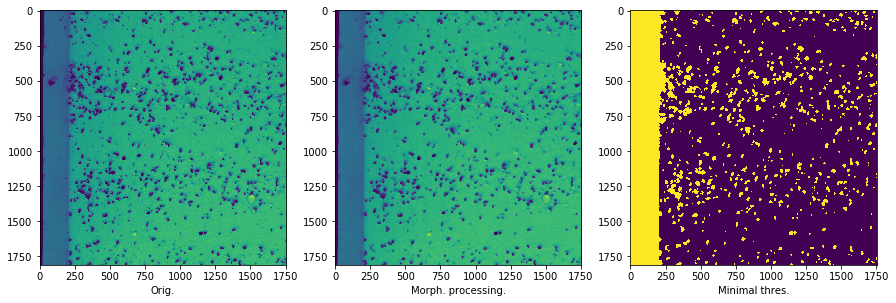

Image N° 47
IoU threshold : 0.3
Stats : Rec : 0.6363636363636364 / Prec : 0.011326860841423949 / F1-score : 0.022257551669316374


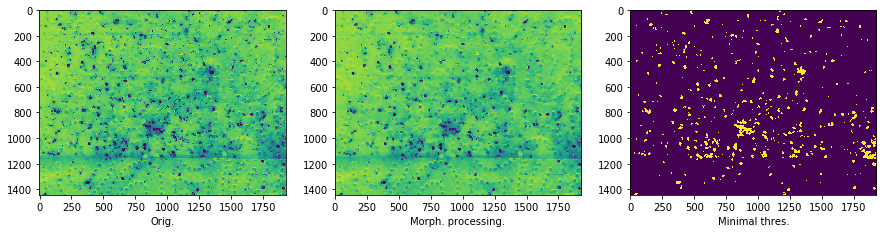

Image N° 48
IoU threshold : 0.3
Stats : Rec : 0.855072463768116 / Prec : 0.14496314496314497 / F1-score : 0.24789915966386555


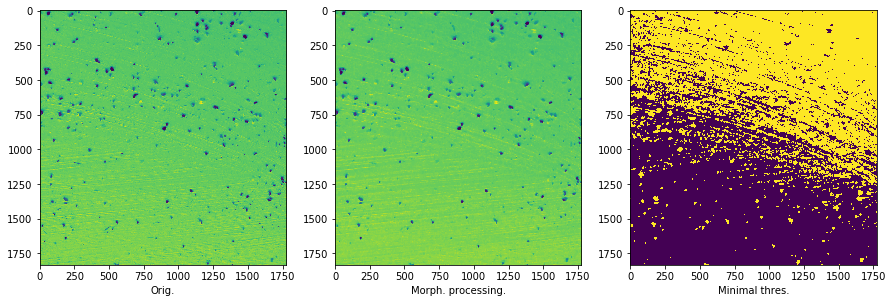

Image N° 49
IoU threshold : 0.3
Stats : Rec : 0.0 / Prec : 0.0 / F1-score : 0.0


In [13]:
#Your code

# Process the images and print some statistics
# TODO : No print at the moment 
for idx,img in enumerate(tst_ic):
    bin_img = pipeline(img)
    label_img = label_varroa_region(bin_img)
    gt_labels = xml_annotation_to_bbox(tst_xmls[idx])
    # Proceed to gather statistics
    print("Image N° {}".format(idx))
    thres_list =  [0.3]
    for thres in thres_list:
        print("IoU threshold : {}".format(thres))
        reg_stats,gt_stats = detection_statistics(label_img,gt_labels,thres)
        f1_score(reg_stats,gt_stats)

## Part 2: Implement your first detector

Write your function(s) for the second part. Feel free to change the name of the function and add your additional functions, but please make sure their input and output follows the mentioned format.

In [3]:
def detect_by_method_1(img):
    '''
    Input: One single image
    Output: A numpy array containing coordonates of all detected varroas, with the following format: 
            [[x_1, y_1, w_1, h_2], [x_2, y_2, w_1, h_2], ..., [x_n, y_n, w_n, h_n]] 
            where ''n'' is the number of detected varroas.
    '''

    #Your code

Add your implementation. Report the Precision, Recall and F1-score, by using all 50 images of the test-set, and considering 0.3 as the IoU threshold.

In [4]:
#Your code

## Part 3: Using MLP and CNNs

Add your implementation for the third part. Feel free to add your desirable functions, but please make sure you have proper functions for the final detection, where their input and output follows the same format as the previous parts.

In [5]:
#Your code

## Challenge

You can generate a json submission file by using the function ''**generate_pred_json**''. This prediction file can be uploaded online for evaluation (Please refer to section 3 of the project description for more details).

In [6]:
import numpy as np
import json

def generate_pred_json(data, tag='baseline'):
    '''
    Input
    - data: Is a dictionary d, such that:
          d = { 
              "ID_1": [], 
              "ID_2": [[x_21, y_21, w_21, h_21], [x_22, y_22, w_22, h_22]], 
              ... 
              "ID_i": [[x_i1, y_i1, w_i1, h_i1], ..., [x_iJ, y_iJ, w_iJ, h_iJ]],
              ... 
              "ID_N": [[x_N1, y_N1, w_N1, h_N1]],
          }
          where ID is the string id of the image (e.i. 5a05e86fa07d56baef59b1cb_32.00px_1) and the value the Kx4 
          array of intergers for the K predicted bounding boxes (e.g. [[170, 120, 15, 15]])
    - tag: (optional) string that will be added to the name of the json file.
    Output
      Create a json file, "prediction_[tag].json", conatining the prediction to EvalAI format.
    '''
    unvalid_key = []
    _data = data.copy()
    for key, value in _data.items():
        try:
            # Try to convert to numpy array and cast as closest int
            print(key)
            v = np.around(np.array(value)).astype(int)
            # Check is it is a 2d array with 4 columns (x,y,w,h)
            if v.ndim != 2 or v.shape[1] != 4:
                unvalid_key.append(key)
            # Id must be a string
            if not isinstance(key, str):
                unvalid_key.append(key)
            _data[key] = v.tolist()
        # Deal with not consistant array size and empty predictions
        except (ValueError, TypeError):
            unvalid_key.append(key)
    # Remove unvalid key from dictionnary
    for key in unvalid_key: del _data[key]
    
    with open('prediction_{}.json'.format(tag), 'w') as outfile:
        json.dump(_data, outfile)

In [7]:
#Your code